In [1]:
%%time
import numpy,moviepy,PIL
import IPython.display
import moviepy.editor
import time
import imagehash
import os
from paddleocr import PaddleOCR,draw_ocr
import logging
logging.basicConfig(level=logging.ERROR)
# import easyocr
# reader = easyocr.Reader(['en']) # this needs to run only once to load the model into memory

Wall time: 2.62 s


In [2]:
videoname="clip.mp4"
foldername=videoname.split(".")[0]
folder_tested_name=foldername+"/tested"
file="199.jpg"
filename=f"{folder_tested_name}/{file}"
def Binarize(img:PIL.Image.Image):
    img=img.convert("L")
    img=img>numpy.mean(img)
    img=PIL.Image.fromarray(img)
    return img
def brightness(img:PIL.Image.Image):
    img=img.convert("L")
    return numpy.mean(img)


img=PIL.Image.open(f"{foldername}/0.jpg")
size=[img.size[0],img.size[1],img.size[0],img.size[1]]

id_scale=[0.060,0.240,0.210, 0.290]
id_croped_size=[id_scale[i]*size[i] for i in range(4)]#define the croped size
title_scale=[0.180,0.100,0.820, 0.200]
title_croped_size=[title_scale[i]*size[i] for i in range(4)]#define the croped size
author_scale=[0.650,0.230,0.835, 0.290]
author_croped_size=[author_scale[i]*size[i] for i in range(4)]#define the croped size

print(brightness(PIL.Image.open(f"{foldername}/91.jpg")))
print(brightness(PIL.Image.open(f"{foldername}/95.jpg")))

52.42255304783951
23.71317756558642


In [ ]:
%%time
#the most slow step

# if not os.path.isdir(foldername):
#     os.mkdir(foldername)
    
# clip=moviepy.editor.VideoFileClip(videoname)
# clip.write_images_sequence(f"{foldername}/%d.jpg",fps=clip.fps/15,verbose=False,logger=None)

In [12]:
%%time

# hash_map={}
# example="./example.jpg"

# hash_map["example"]=imagehash.average_hash(PIL.Image.open(example))
# for file in files:
#     hash_map[file.split(".")[0]]=imagehash.average_hash(PIL.Image.open(f"{foldername}/{file}"))

# diff=dict([(k,hash_map["example"]-v) for k,v in hash_map.items()])
# sorted(diff.items(), key=lambda item: item[1])

Wall time: 2min 6s


In [19]:
for file in os.listdir(folder_tested_name):
    os.remove(f"{folder_tested_name}/{file}")

In [24]:
from shutil import copyfile
# copyfile(src, dst)

if not os.path.exists(folder_tested_name):
    os.mkdir(folder_tested_name)

tested_order=[]
for k,v in diff.items():
    if k=="example":
        continue
    if v<5:
        img_name=k+".jpg"
        img=PIL.Image.open(f"{foldername}/{img_name}").convert("L")
        if (numpy.mean(img)<45):
            continue
        copyfile(f"{foldername}/{img_name}",f"{folder_tested_name}/{img_name}")
        tested_order.append(int(k))

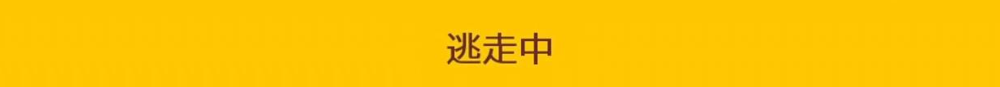

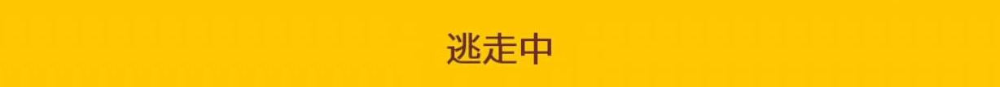

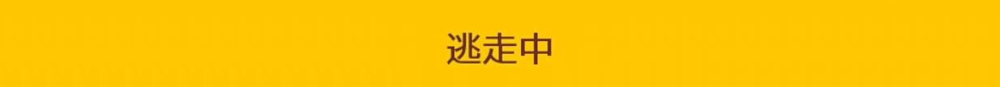

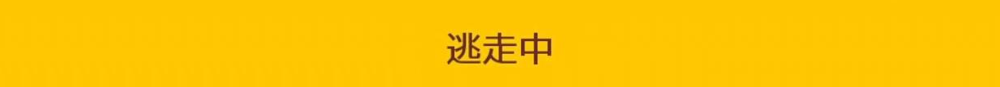

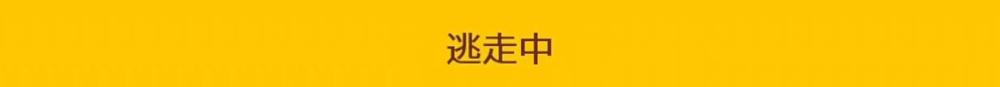

...

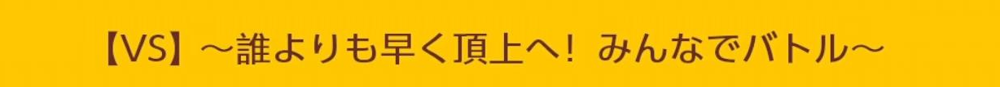

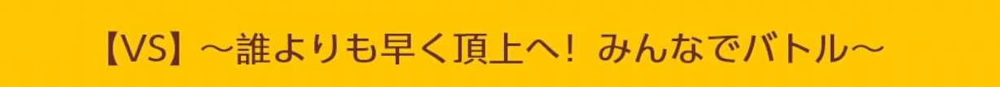

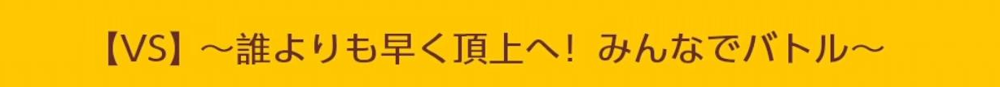

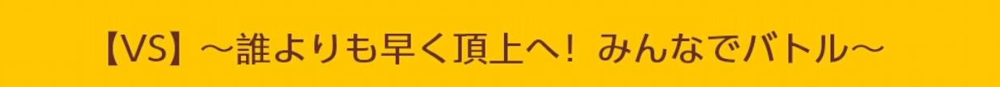

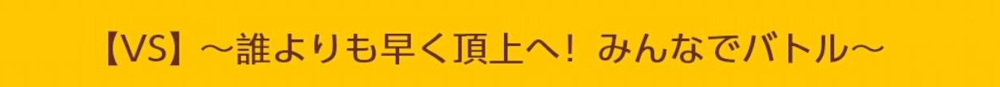

Wall time: 3.7 s


In [9]:
%%time


#crop the image, only save the word
for file in os.listdir(folder_tested_name):
    filename=f"{folder_tested_name}/{file}"
    img=PIL.Image.open(filename)

    croped=img.crop(title_croped_size)
    IPython.display.display(croped)



3437.jpg


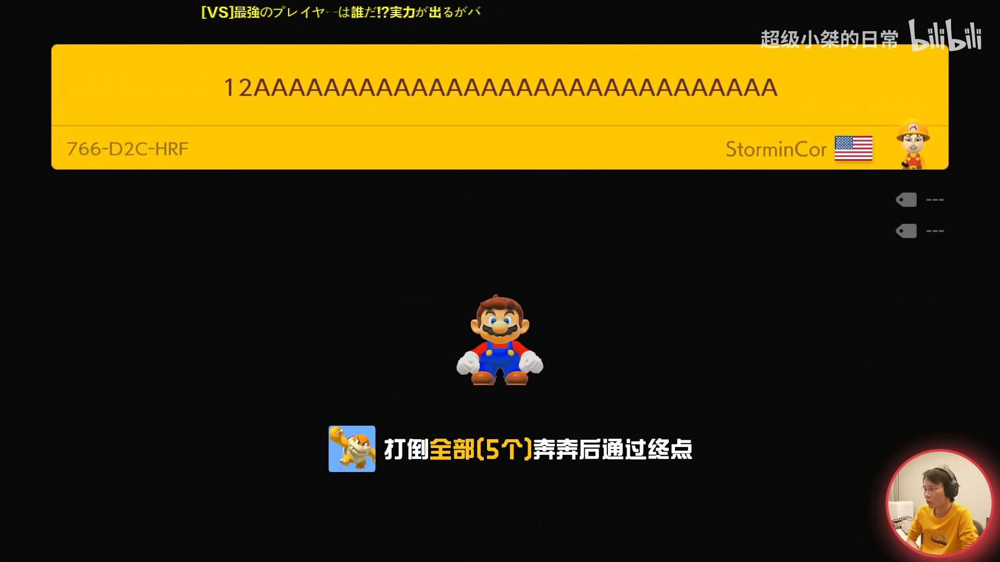

Wall time: 159 ms


In [293]:
%%time
file=os.listdir(folder_tested_name)[numpy.random.randint(len(os.listdir(folder_tested_name)))]
filename=f"{folder_tested_name}/{file}"
print(file)



img=PIL.Image.open(filename)
croped=img#.crop(author_croped_size)

IPython.display.display(croped)
# result = ocr.ocr(numpy.array(croped))
# for line in result:
#     print(line)

In [19]:
%%time
ocr_en = PaddleOCR(use_angle_cls=True, lang='en',show_log=False) # need to run only once to download and load model into memory
ocr_jp = PaddleOCR(use_angle_cls=True, lang='japan',show_log=False)

[2021/11/22 17:53:18] root WARNING: lang en is not support in PP-OCRv2, auto switch to version PP-OCR


[2021/11/22 17:53:18] root WARNING: lang en is not support in PP-OCRv2, auto switch to version PP-OCR


[2021/11/22 17:53:18] root WARNING: version PP-OCRv2 not support cls models, auto switch to version PP-OCR
Namespace(help='==SUPPRESS==', use_gpu=True, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, image_dir=None, det_algorithm='DB', det_model_dir='C:\\Users\\k-on/.paddleocr/2.3.0.2\\ocr\\det\\en\\en_ppocr_mobile_v2.0_det_infer', det_limit_side_len=960, det_limit_type='max', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_sast_polygon=False, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_box_type='box', det_pse_scale=1, rec_algorithm='CRNN', rec_model_dir='C:\\Users\\k-on/.paddleocr/2.3.0.2\\ocr\\rec\\en\\en_number_mobile_v2.0_rec_infer', rec_image_shape='3, 32, 320', rec_batch_num=6, max_text_length=25, 

[2021/11/22 17:53:19] root WARNING: lang en is not support in PP-OCRv2, auto switch to version PP-OCR


[2021/11/22 17:53:19] root WARNING: lang japan is not support in PP-OCRv2, auto switch to version PP-OCR


[2021/11/22 17:53:19] root WARNING: version PP-OCRv2 not support cls models, auto switch to version PP-OCR
Namespace(help='==SUPPRESS==', use_gpu=True, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, image_dir=None, det_algorithm='DB', det_model_dir='C:\\Users\\k-on/.paddleocr/2.3.0.2\\ocr\\det\\en\\en_ppocr_mobile_v2.0_det_infer', det_limit_side_len=960, det_limit_type='max', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_sast_polygon=False, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_box_type='box', det_pse_scale=1, rec_algorithm='CRNN', rec_model_dir='C:\\Users\\k-on/.paddleocr/2.3.0.2\\ocr\\rec\\japan\\japan_mobile_v2.0_rec_infer', rec_image_shape='3, 32, 320', rec_batch_num=6, max_text_length=25, r

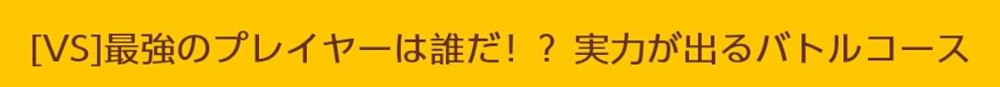

[[[38.0, 40.0], [1185.0, 40.0], [1185.0, 79.0], [38.0, 79.0]], ('MS1最強のプレイヤーは誰だ!？実力が出るバトルコース', 0.9112264)]
[[[38.0, 40.0], [1185.0, 40.0], [1185.0, 79.0], [38.0, 79.0]], ('[VS', 0.6781946)]
Wall time: 82.1 ms


In [20]:
%%time
# Paddleocr supports Chinese, English, French, German, Korean and Japanese.
# You can set the parameter `lang` as `ch`, `en`, `fr`, `german`, `korean`, `japan`
# to switch the language model in order.
IPython.display.display(croped)

result = ocr_jp.ocr(numpy.array(croped))
for line in result:
    print(line)

result = ocr_en.ocr(numpy.array(croped))
for line in result:
    print(line)
    
# result = ocr.ocr(numpy.array(img))
# IPython.display.display(img)
# for line in result:
#     print(line)

In [4]:
import torch 
print(torch.cuda.device_count())
print(torch.cuda.is_available())
print(torch.cuda.get_device_name())
print(torch.cuda_version)

1
True
NVIDIA GeForce GTX 1660
10.2
